Copyright© - Biofourmis 2020 - Confidential 
Requirement: 
1. Use Python to develop a binary classification algorithm. 
2. This algorithm shall detect the 'V' beats in Electrocardiogram (ECG), as shown in "Fig: Train". 

In [1]:
#Background:
#1. What's Electrocardiogram (ECG)? 
#   [https://en.wikipedia.org/wiki/Electrocardiography]
#2. What's V beat? (Premature ventricular contraction) 
#   [https://en.wikipedia.org/wiki/Premature_ventricular_contraction]
#3. Hint: Features of V beats: peak-to-peak intervals, peak amplitudes, peak inverted. 
#   [https://www.dropbox.com/s/qeodwvh8rkii2dp/v-beats-features.pdf?dl=0]

In [2]:
# # import sys
# !conda install seaborn scikit-learn statsmodels numba pytables -y
# !conda install -c conda-forge python-igraph leidenalg -y
# !{sys.executable} -m pip install wfdb statsmodels quanp MulticoreTSNE
# !{sys.executable} -m pip install git+https://github.com/slundberg/shap.git
# !{sys.executable} -m pip install xgboost lightgbm torch
# !{sys.executable} -m pip install factor_analyzer

In [3]:
#Supporting functions:
%matplotlib inline
import wfdb
import matplotlib.pyplot as plt
def read_ecg(file_path):
    """
    output: ecg files, get signal, annotated peaks, annotated types
    input: ecg file id
    """
    signals, fields = wfdb.rdsamp(file_path)
    annotation = wfdb.rdann(file_path, 'atr')
    ecg_sig = signals[:,0]
    ecg_type = annotation.symbol
    ecg_peak = annotation.sample
    return ecg_sig, ecg_type, ecg_peak

def plot_ecg(ecg_sig, ecg_type, ecg_peak, title='Fig: Train', npeak=10, len_sig=3000):
    """
    demo plot ecg signal with annotated peaks, annotated types
    """
    _, ax = plt.subplots()
    for i in range(0, npeak):
        ax.annotate(ecg_type[i], xy=(ecg_peak[i], -2))
    ax.plot(ecg_sig[0:len_sig])
    ax.plot(ecg_peak[0:npeak], ecg_sig[ecg_peak[0:npeak]], '*')
    ax.set_title(title)

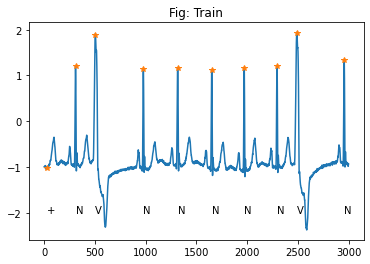

In [4]:
#What's included in the training database? 
#1. The training database contains a group of ECG signals and annotations: 
#2. In each annotation, the type of each beat is annotated on its peak (N, V, ...), 
#   For example: 
training_file_path = './database/train/a4'
ecg_sig, ecg_type, ecg_peak = read_ecg(training_file_path)
plot_ecg(ecg_sig, ecg_type, ecg_peak)

# Import libraries and functions

In [5]:
# Auto reload all .py file
%load_ext autoreload
%autoreload

import pandas as pd
import numpy as np
import matplotlib.pyplot as pl

from IPython.display import display
from matplotlib import rcParams

# user defined modules/functions
from utils import compute_intervals, train_valid_test_split, evaluate_model_cv

pd.set_option('display.max_columns', None) 

# Augmented Dickey-Fuller test

To Check if the time-series ECG signals are stationary (i.e. mean and variance not changing over the time), 

**Null Hypothesis (H0):** If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.

**Alternate Hypothesis (H1):** The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.

**p-value > 0.05:** Fail to reject the null hypothesis (H0), the data has a unit root and is non-stationary.  
**p-value <= 0.05:** Reject the null hypothesis (H0), the data does not have a unit root and is stationary.


In [6]:
# read all train signal type
df_type = pd.DataFrame(ecg_type, columns=['ecg_type'], index=ecg_peak)

# read all train peak location
df_peak = pd.DataFrame(ecg_peak, columns=['ecg_peak'], index=ecg_peak)

# compute intervals with between n-lag of peaks
for lag_count in range(1, 11):
    df_peak['p_interval_lag{}'.format(lag_count)] = compute_intervals(df_peak['ecg_peak'], 
                                                                      lag_count)
df_sig = pd.DataFrame(ecg_sig, columns=['ecg_sig'])
df_sig['ecg_amplitude'] = df_sig['ecg_sig'] - df_sig['ecg_sig'].median() # adding other attribute

In [7]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df_sig.ecg_sig.values[:200])

print('First 200 data points')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))
    
result = adfuller(df_sig.ecg_sig.values[:2000])
print('\nFirst 2000 data points')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

result = adfuller(df_sig.ecg_sig.values[:20000])
print('\nFirst 20000 data points')
print('ADF Statistic: %f' % result[0])
print('p-value: %f' % result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

First 200 data points
ADF Statistic: -3.440652
p-value: 0.009649
Critical Values:
	1%: -3.466
	5%: -2.877
	10%: -2.575

First 2000 data points
ADF Statistic: -6.479101
p-value: 0.000000
Critical Values:
	1%: -3.434
	5%: -2.863
	10%: -2.568

First 20000 data points
ADF Statistic: -15.671528
p-value: 0.000000
Critical Values:
	1%: -3.431
	5%: -2.862
	10%: -2.567


-0.94

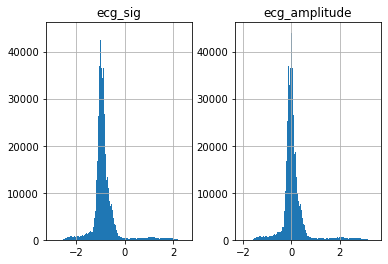

In [8]:
df_sig.hist(bins=200)
df_sig.describe().loc['50%', 'ecg_sig']

Although the first 200, 2000, 20000 datapoints seems to be stationary (*p*<0.05). 

In [9]:
# concatenate all dataframes
df_all = pd.concat([df_sig, df_type, df_peak], axis=1)

df_all['ecg_type'] = df_all['ecg_type'].fillna(0)

replace_dict = {'+': 0,
                'N': 0,
                'V': 1, 
                '~': 0}

df_all.replace({'ecg_type': replace_dict}, inplace=True)

df_all.columns

Index(['ecg_sig', 'ecg_amplitude', 'ecg_type', 'ecg_peak', 'p_interval_lag1',
       'p_interval_lag2', 'p_interval_lag3', 'p_interval_lag4',
       'p_interval_lag5', 'p_interval_lag6', 'p_interval_lag7',
       'p_interval_lag8', 'p_interval_lag9', 'p_interval_lag10'],
      dtype='object')

In [10]:
df_all = df_all.drop(columns=['ecg_peak'])
df_all = df_all.fillna(0)
df_all.head()

,ecg_sig,ecg_amplitude,ecg_type,p_interval_lag1,p_interval_lag2,p_interval_lag3,p_interval_lag4,p_interval_lag5,p_interval_lag6,p_interval_lag7,p_interval_lag8,p_interval_lag9,p_interval_lag10
0,-0.995,-0.055,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.995,-0.055,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.995,-0.055,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-0.995,-0.055,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.995,-0.055,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
# split train and test datasets
X_train, X_valid, X_test, y_train, y_valid, y_test  = train_valid_test_split(df_all.drop(columns=['ecg_type']), 
                                                                             df_all['ecg_type'], 
                                                                             0.6, 0.2, 0.2)

In [12]:
def get_time_series_indicators(dataset):
    # Create 7 and 21 days Moving Average
    dataset['ma7'] = dataset['ecg_sig'].rolling(window=7).mean()
    dataset['ma21'] = dataset['ecg_sig'].rolling(window=21).mean()
    
    # Create MACD
    dataset['26ema'] = dataset['ecg_sig'].ewm(span=26).mean()
    dataset['12ema'] = dataset['ecg_sig'].ewm(span=12).mean()
    dataset['MACD'] = (dataset['12ema']-dataset['26ema'])

    # Create Bollinger Bands
    dataset['20sd'] = dataset['ecg_sig'].rolling(20).std()
    dataset['upper_band'] = dataset['ma21'] + (dataset['20sd']*2)
    dataset['lower_band'] = dataset['ma21'] - (dataset['20sd']*2)
    
    # Create Exponential moving average
    dataset['ema'] = dataset['ecg_sig'].ewm(com=0.5).mean()
    
    # Create Momentum
    dataset['momentum'] = dataset['ecg_sig']-1
    
    return dataset

X_train = get_time_series_indicators(X_train)
X_valid = get_time_series_indicators(X_valid)
X_test = get_time_series_indicators(X_test)

## Fourier transforms for trend analysis
Fourier transforms take a function and create a series of sine waves (with different amplitudes and frames). When combined, these sine waves approximate the original function. Mathematically speaking, the transforms look like this:

$$G(f) = \int_{-\infty}^\infty g(t) e^{-i 2 \pi f t} dt$$

We will use Fourier transforms to extract global and local trends in the ECG signals, and to also denoise it a little. So let's see how it works.

In [13]:
close_fft_train = np.fft.fft(np.asarray(X_train['ecg_sig'].tolist()))
close_fft_valid = np.fft.fft(np.asarray(X_valid['ecg_sig'].tolist()))
close_fft_test = np.fft.fft(np.asarray(X_test['ecg_sig'].tolist()))

fft_df_train = pd.DataFrame({'fft':close_fft_train})
fft_df_valid = pd.DataFrame({'fft':close_fft_valid})
fft_df_test = pd.DataFrame({'fft':close_fft_test})

fft_df_train['absolute'] = fft_df_train['fft'].apply(lambda x: np.abs(x))
fft_df_valid['absolute'] = fft_df_valid['fft'].apply(lambda x: np.abs(x))
fft_df_test['absolute'] = fft_df_test['fft'].apply(lambda x: np.abs(x))


fft_df_train['angle'] = fft_df_train['fft'].apply(lambda x: np.angle(x))
fft_df_valid['angle'] = fft_df_valid['fft'].apply(lambda x: np.angle(x))
fft_df_test['angle'] = fft_df_test['fft'].apply(lambda x: np.angle(x))


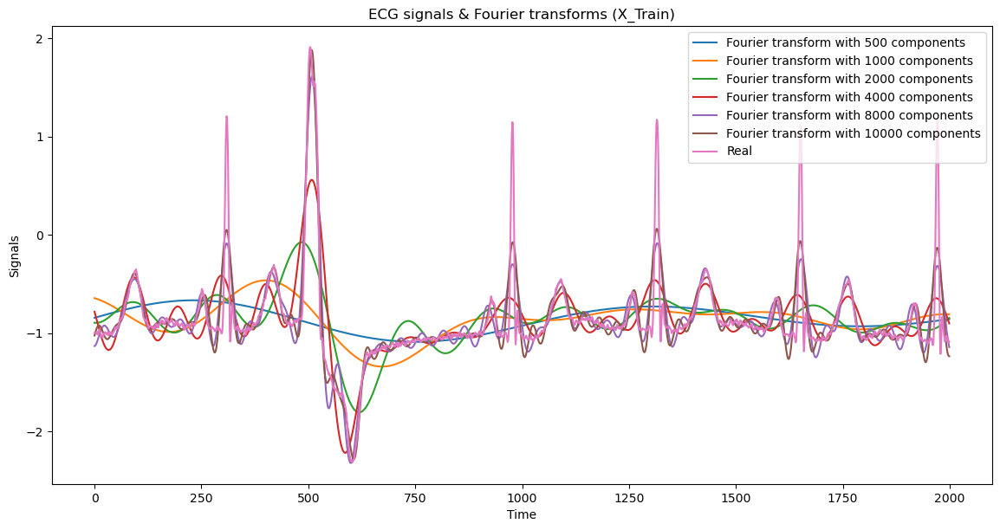

In [14]:
plt.figure(figsize=(14, 7), dpi=100)

fft_list_train = np.asarray(fft_df_train['fft'].tolist())
fft_list_valid = np.asarray(fft_df_valid['fft'].tolist())
fft_list_test = np.asarray(fft_df_test['fft'].tolist())

for num_ in [500, 1000, 2000, 4000, 8000, 10000]:
    fft_list_m10_train = np.copy(fft_list_train); 
    fft_list_m10_valid = np.copy(fft_list_valid); 
    fft_list_m10_test = np.copy(fft_list_test); 

    fft_list_m10_train[num_:-num_]=0
    fft_list_m10_valid[num_:-num_]=0
    fft_list_m10_test[num_:-num_]=0

    X_train['ft_{}'.format(num_)] = np.real_if_close(np.fft.ifft(fft_list_m10_train)).real
    X_valid['ft_{}'.format(num_)] = np.real_if_close(np.fft.ifft(fft_list_m10_valid)).real
    X_test['ft_{}'.format(num_)] = np.real_if_close(np.fft.ifft(fft_list_m10_test)).real

    plt.plot(np.real_if_close(np.fft.ifft(fft_list_m10_train)).real[:2000], label='Fourier transform with {} components'.format(num_));

plt.plot(df_sig['ecg_sig'][:2000],  label='Real');
plt.xlabel('Time');
plt.ylabel('Signals');
plt.title('ECG signals & Fourier transforms (X_Train)');
plt.legend();
plt.show();

In [15]:
# drop first few columns with na derivatives 
X_train = X_train[20:]
X_valid = X_valid[20:]
X_test = X_test[20:]
y_train = y_train[20:]
y_valid = y_valid[20:]
y_test = y_test[20:]

In [16]:
from sklearn.preprocessing import MinMaxScaler

# Initialize a scaler, then apply it to the features
scaler1 = MinMaxScaler()
numerical1 = list(X_train.columns)

df_features_clustering = pd.DataFrame(data=X_train)
df_features_clustering[numerical1] = scaler1.fit_transform(X_train[numerical1])

In [17]:
import quanp as qp

# Loading pandas dataframe as anndata 
adata = qp.AnnData(df_features_clustering)

# log(x+1) transformation for all data
qp.pp.log1p(adata)

# add a new `.obs` column for all comapnanies called `GICS_Sector`
adata.obs['ecg_type'] = y_train.values.astype(str)

#Set the .raw attribute of AnnData object to the normalized and logarithmized raw gene expression for later 
# use in differential testing and visualizations of features expression. This simply freezes the state of the AnnData object.
adata.raw = adata

# Standardization scaling per feature
qp.pp.scale(adata)

/home/hongkai/anaconda3/envs/py36_timeseries/lib/python3.6/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [18]:
qp.tl.pca(adata, svd_solver='arpack')


In [19]:
X_train.columns

Index(['ecg_sig', 'ecg_amplitude', 'p_interval_lag1', 'p_interval_lag2',
       'p_interval_lag3', 'p_interval_lag4', 'p_interval_lag5',
       'p_interval_lag6', 'p_interval_lag7', 'p_interval_lag8',
       'p_interval_lag9', 'p_interval_lag10', 'ma7', 'ma21', '26ema', '12ema',
       'MACD', '20sd', 'upper_band', 'lower_band', 'ema', 'momentum', 'ft_500',
       'ft_1000', 'ft_2000', 'ft_4000', 'ft_8000', 'ft_10000'],
      dtype='object')

/home/hongkai/anaconda3/envs/py36_timeseries/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'ecg_type' as categorical


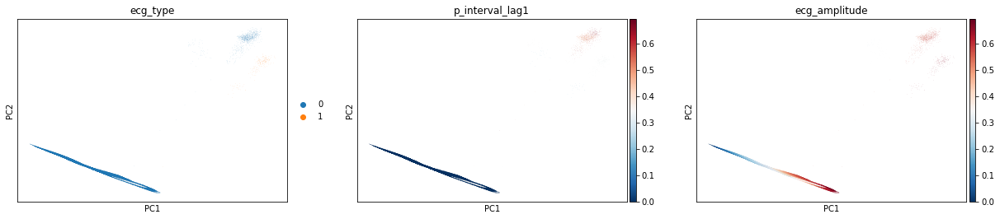

In [20]:
qp.pl.pca(adata, color=['ecg_type', 'p_interval_lag1', 'ecg_amplitude'], color_map='RdBu_r', use_raw=True);


We can see that PC1 + PC2 seems to be able to separate the 0 ('non-V) and 1 ('V').

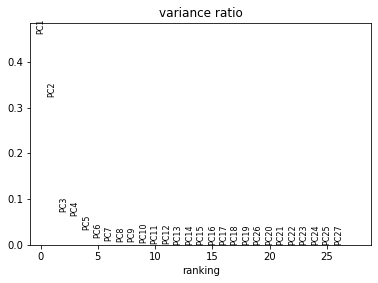

In [24]:
qp.pl.pca_variance_ratio(adata, n_pcs=len(adata.var_names));


First 4 pcs are located at the elbow point. However we are choosing 5 pcs for the clustering and further dimensional reductions for better visualization

In [25]:
# qp.tl.tsne(adata, n_pcs=5, n_jobs=38, use_fast_tsne=True); # only consider the first 5 pcs
# qp.pl.tsne(adata, color=['ecg_type', 'p_interval_lag1', 'ecg_amplitude'], color_map='RdBu_r', use_raw=True);


In [26]:
qp.pp.neighbors(adata, n_neighbors=25, n_pcs=5);


In [27]:
qp.tl.leiden(adata)


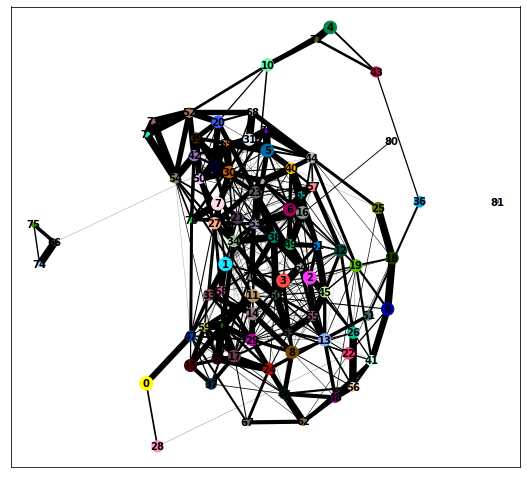

In [28]:
rcParams['figure.figsize'] = 8,8
qp.tl.paga(adata)
qp.pl.paga(adata, plot=True)

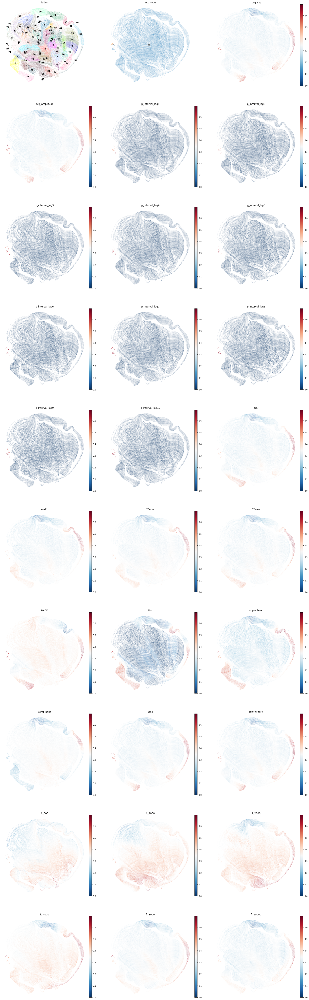

In [46]:
rcParams['figure.figsize'] = 8,8
qp.tl.umap(adata, init_pos='paga')
qp.pl.umap(adata, color=['leiden', 'ecg_type'] + list(adata.var_names),
           legend_loc='on data', frameon=False,  color_map='RdBu_r', 
           use_raw=True, ncols=3)

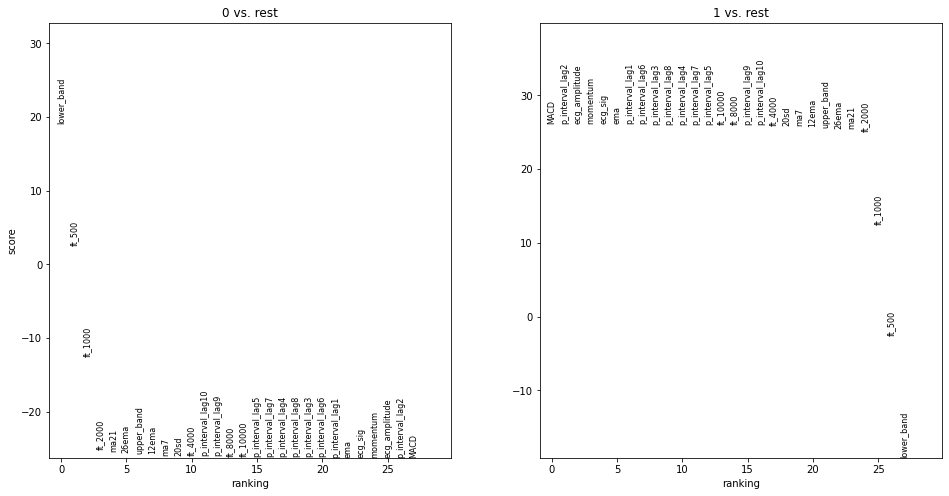

In [50]:
qp.tl.rank_features_groups(adata, 'ecg_type', method='wilcoxon')
qp.pl.rank_features_groups(adata, n_features=30, sharey=False)

/home/hongkai/anaconda3/envs/py36_timeseries/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/home/hongkai/anaconda3/envs/py36_timeseries/lib/python3.6/site-packages/quanp/plotting/_matrixplot.py:222: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  __ = ax.pcolor(_color_df, **kwds)


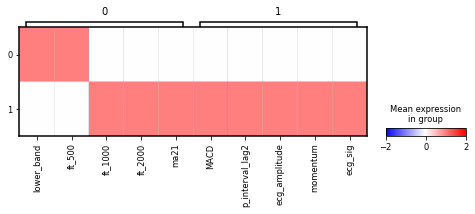

In [48]:
qp.pl.rank_features_groups_matrixplot(adata, n_features=5, use_raw=False, 
                                      standard_scale='var',
                                      vmin=-2, vmax=2, cmap='bwr',
                                      figsize=(8,2));

# Adding dimensional reduced factors

In [19]:
# Import required libraries
from factor_analyzer import FactorAnalyzer
import matplotlib.pyplot as plt

# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer(rotation=None)
fa.fit(X_train)

# Check Eigenvalues
ev, v = fa.get_eigenvalues()

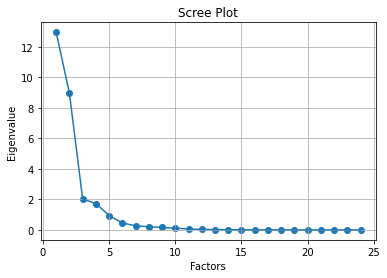

In [20]:
# Create scree plot using matplotlib
plt.scatter(range(1,25),ev[:24])
plt.plot(range(1,25),ev[:24])
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

First 4 factors are located at the elbow points

In [21]:
print('The factor variances: {}'.format(fa.get_factor_variance()[0]))
print('The proportional factor variances: {}'.format(fa.get_factor_variance()[1]))
print('The cumulative factor variances: {}'.format(fa.get_factor_variance()[2]))

The factor variances: [12.84421949  8.90753113  1.75630759]
The proportional factor variances: [0.45872212 0.31812611 0.06272527]
The cumulative factor variances: [0.45872212 0.77684824 0.83957351]


In [22]:
# Create factor analysis object and perform factor analysis
n_ftrs = 4
fa = FactorAnalyzer(rotation='varimax', n_factors=n_ftrs, method='principal')
fa.fit(X_train)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()

In [23]:
fa_loading_matrix = pd.DataFrame(fa.loadings_, columns=['FA{}'.format(i) for i in range(1, n_ftrs+1)], 
                              index=X_train.columns)
fa_loading_matrix['Highest_loading'] = fa_loading_matrix.idxmax(axis=1)
fa_loading_matrix = fa_loading_matrix.sort_values('Highest_loading')
fa_loading_matrix.to_csv('FA_varimax_ml_8factors_Commufiltered.csv')

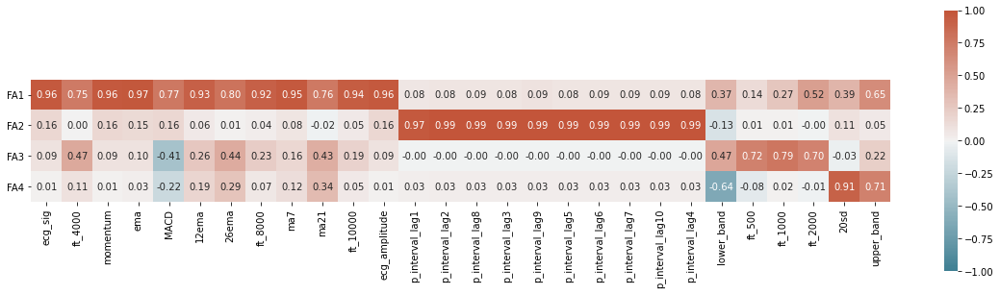

In [24]:
import seaborn as sns

plt.figure(figsize=(20,5))

# plot the heatmap for correlation matrix
ax = sns.heatmap(fa_loading_matrix.drop('Highest_loading', axis=1).T, 
                vmin=-1, vmax=1, center=0,
                cmap=sns.diverging_palette(220, 20, n=200),
                square=True, annot=True, fmt='.2f')

ax.set_yticklabels(
    ax.get_yticklabels(),
    rotation=0);

In [25]:
X_train_transformed_varimax_princ_fa = pd.DataFrame(fa.transform(X_train), index=X_train.index, columns=['F{}'.format(i+1) for i in range(n_ftrs)])
X_valid_transformed_varimax_princ_fa = pd.DataFrame(fa.transform(X_valid), index=X_valid.index, columns=['F{}'.format(i+1) for i in range(n_ftrs)])
X_test_transformed_varimax_princ_fa = pd.DataFrame(fa.transform(X_test), index=X_test.index, columns=['F{}'.format(i+1) for i in range(n_ftrs)])


X_train[['F{}'.format(i+1) for i in range(n_ftrs)]] = X_train_transformed_varimax_princ_fa[['F{}'.format(i+1) for i in range(n_ftrs)]]
X_valid[['F{}'.format(i+1) for i in range(n_ftrs)]] = X_valid_transformed_varimax_princ_fa[['F{}'.format(i+1) for i in range(n_ftrs)]]
X_test[['F{}'.format(i+1) for i in range(n_ftrs)]] = X_test_transformed_varimax_princ_fa[['F{}'.format(i+1) for i in range(n_ftrs)]]


# Classification

In [26]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import torch
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn import svm
from lightgbm import LGBMClassifier
import xgboost
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tqdm import tqdm

# import setting as setting
# import helper as helper

pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

%matplotlib inline

# check if CUDA is available
use_cuda = torch.cuda.is_available()
print(use_cuda)

# HK_Projects_dir = '/acrc/jinmiao/CJM_lab/HongKai/Projects/SLE_Merck/Data_intermediate/'

# os.chdir(HK_Projects_dir)

False


In [27]:
from sklearn.preprocessing import MinMaxScaler

# Initialize a scaler, then apply it to the features
scaler2 = MinMaxScaler() # default=(0, 1)
numerical2 = X_train.columns

X_train[numerical2] = scaler2.fit_transform(X_train[numerical2]);
X_valid[numerical2] = scaler2.transform(X_valid[numerical2]);
X_test[numerical2] = scaler2.transform(X_test[numerical2]);

# Show an example of a record with scaling applied
display(X_train.head(n = 5))
display(X_valid.head(n = 5))
display(X_test.head(n = 5))

,ecg_sig,ecg_amplitude,p_interval_lag1,p_interval_lag2,p_interval_lag3,p_interval_lag4,p_interval_lag5,p_interval_lag6,p_interval_lag7,p_interval_lag8,p_interval_lag9,p_interval_lag10,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,ft_500,ft_1000,ft_2000,ft_4000,ft_8000,ft_10000,F1,F2,F3,F4
20,0.321816,0.321816,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.324850,0.333299,0.346798,0.339427,0.460306,0.013082,0.251670,0.394858,0.322111,0.321816,0.464273,0.634223,0.510668,0.414171,0.366370,0.320536,0.261458,0.105036,0.547826,0.207156
21,0.325765,0.325765,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.324421,0.333095,0.346646,0.339462,0.460851,0.013179,0.251545,0.394606,0.324519,0.325765,0.465465,0.632840,0.511603,0.411027,0.367122,0.318319,0.273918,0.098379,0.548521,0.208501
22,0.325765,0.325765,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.324564,0.332891,0.346511,0.339491,0.461331,0.013238,0.251402,0.394374,0.325322,0.325765,0.466655,0.631437,0.512585,0.408087,0.367567,0.316196,0.265668,0.103225,0.546317,0.206492
23,0.329714,0.329714,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.325422,0.332891,0.346815,0.340194,0.462709,0.013238,0.251402,0.394374,0.328234,0.329714,0.467843,0.630013,0.513613,0.405360,0.367710,0.314218,0.274052,0.099132,0.545863,0.206606
24,0.330701,0.330701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.326566,0.332942,0.347192,0.340954,0.464056,0.013347,0.251492,0.394367,0.329865,0.330701,0.469030,0.628570,0.514686,0.402856,0.367560,0.312430,0.269217,0.102296,0.543819,0.204867


,ecg_sig,ecg_amplitude,p_interval_lag1,p_interval_lag2,p_interval_lag3,p_interval_lag4,p_interval_lag5,p_interval_lag6,p_interval_lag7,p_interval_lag8,p_interval_lag9,p_interval_lag10,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,ft_500,ft_1000,ft_2000,ft_4000,ft_8000,ft_10000,F1,F2,F3,F4
390020,0.332675,0.332675,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.335859,0.337433,0.353738,0.348031,0.467921,0.003817,0.251035,0.403785,0.333443,0.332675,0.477331,0.535395,0.502292,0.436420,0.352254,0.318428,0.276163,0.101936,0.522017,0.197903
390021,0.331688,0.331688,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.335573,0.337586,0.353614,0.347732,0.467322,0.003817,0.251160,0.403936,0.332263,0.331688,0.483723,0.533862,0.498147,0.439468,0.352343,0.319434,0.279088,0.099874,0.524145,0.198974
390022,0.331688,0.331688,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.335287,0.337586,0.353504,0.347482,0.466839,0.003690,0.251105,0.404002,0.331870,0.331688,0.490174,0.532192,0.493910,0.442696,0.353182,0.321519,0.282624,0.097960,0.525760,0.199566
390023,0.331688,0.331688,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.334858,0.337637,0.353404,0.347272,0.466451,0.003690,0.251147,0.404052,0.331738,0.331688,0.496680,0.530391,0.489621,0.445993,0.354647,0.324227,0.282242,0.098321,0.526460,0.199262
390024,0.330701,0.330701,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.334001,0.337586,0.353211,0.346927,0.465902,0.003835,0.251168,0.403926,0.331034,0.330701,0.503241,0.528464,0.485317,0.449255,0.356528,0.326991,0.276351,0.101629,0.526343,0.198140


,ecg_sig,ecg_amplitude,p_interval_lag1,p_interval_lag2,p_interval_lag3,p_interval_lag4,p_interval_lag5,p_interval_lag6,p_interval_lag7,p_interval_lag8,p_interval_lag9,p_interval_lag10,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,ft_500,ft_1000,ft_2000,ft_4000,ft_8000,ft_10000,F1,F2,F3,F4
520020,0.386969,0.386969,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.406205,0.424343,0.447646,0.427307,0.452231,0.033359,0.335184,0.474139,0.390746,0.386969,0.854570,1.030412,0.626421,0.508200,0.415824,0.364431,0.287452,0.102460,0.830929,0.194202
520021,0.382034,0.382034,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.401487,0.423169,0.444588,0.423209,0.447894,0.042558,0.338219,0.468170,0.385078,0.382034,0.851947,1.018145,0.601905,0.515523,0.406519,0.363498,0.293021,0.097410,0.825342,0.205823
520022,0.377098,0.377098,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.396054,0.421536,0.441315,0.418921,0.443568,0.052018,0.340990,0.461610,0.379884,0.377098,0.849258,1.005513,0.578378,0.522257,0.398483,0.365124,0.289497,0.097625,0.817540,0.215250
520023,0.374136,0.374136,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.390764,0.419597,0.438059,0.414810,0.439756,0.060271,0.342986,0.455380,0.376169,0.374136,0.846501,0.992530,0.555913,0.528018,0.392154,0.367912,0.288174,0.097145,0.809124,0.223338
520024,0.371175,0.371175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.385902,0.417300,0.434817,0.410846,0.436377,0.067118,0.344078,0.449531,0.372947,0.371175,0.843678,0.979208,0.534579,0.532486,0.387693,0.370349,0.282604,0.099334,0.799533,0.229183


In [28]:
n_jobs=6
nthread=6

# define model
tree = DecisionTreeClassifier(random_state=100)
forest = RandomForestClassifier(random_state=100, n_jobs=n_jobs)
adaBoost = AdaBoostClassifier(random_state=100)
GradBoost = GradientBoostingClassifier(random_state=100)
lgbm = LGBMClassifier(random_state=100, n_jobs=n_jobs)
xgb = xgboost.XGBClassifier(random_state=100, nthread=nthread)
sv = svm.SVC(random_state=100, decision_function_shape='ovo')

In [29]:
from sklearn.metrics import cohen_kappa_score, recall_score, precision_score, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt

def evaluate_model_cv(model, x_train, y_train, x_test, y_test, cv):
    
    model = model.fit(x_train, y_train)
    
    # evaluate model by f1     
    scores_f1 = cross_val_score(model, x_train, y_train, scoring="f1_weighted", cv=cv, n_jobs=n_jobs)
    
    # evaluate model by recall     
    scores_recall = cross_val_score(model, x_train, y_train, scoring="recall_weighted", cv=cv, n_jobs=n_jobs)
    
    # evaluate model by accuracy
    scores_acc = cross_val_score(model, x_train, y_train, scoring="accuracy", cv=cv, n_jobs=n_jobs)
    
    # evaluate model by precision
    scores_precision = cross_val_score(model, x_train, y_train, scoring="precision_weighted", cv=cv, n_jobs=n_jobs)
    
    
    # consolidate cv results     
    s_f1 = pd.Series(scores_f1, name='F1')
    s_acc = pd.Series(scores_acc, name='Accuracy')
    s_recall = pd.Series(scores_recall, name='Recall')
    s_precision = pd.Series(scores_precision, name='Precision')
    df = pd.concat([s_recall, s_precision, s_acc, s_f1], axis=1)
    
    
    # test performance
    test_accuracy = model.score(x_test, y_test)
    
    
    # prediction scores
    pred = model.predict(x_test)
    test_recall_score = recall_score(y_test, pred, average='weighted')
    test_precision_score =  precision_score(y_test, pred, average='weighted')
    test_accuracy_score = accuracy_score(y_test, pred)
    test_qwk_score = cohen_kappa_score(y_test, pred, weights='quadratic')
    
    
    # plot the heatmap for crosstab matrix
    df_crosstab = pd.DataFrame({'y_test': y_test, 'y_predicted': pred})

    plt.figure(figsize=(15,5))
    ax = sns.heatmap(pd.crosstab(df_crosstab.y_test, df_crosstab.y_predicted).T, 
                square=True, annot=True, fmt='.2f')

    ax.set_yticklabels(
        ax.get_yticklabels(),
        rotation=0);

    
    return ('CV:', df.mean(), 
            'Test recall:', test_recall_score,
            'Test precision:', test_precision_score,
            'Test accuracy: ', test_accuracy_score,
            'test_quadratic_weighted_kappa: ', test_qwk_score)

In [30]:
columns_wo_ecgsig = [fea for fea in X_train.columns if fea not in ['ecg_sig']]


('CV:',
 Recall       1.0
 Precision    1.0
 Accuracy     1.0
 F1           1.0
 dtype: float64,
 'Test recall:',
 0.9999846130173873,
 'Test precision:',
 0.9999846130173873,
 'Test accuracy: ',
 0.9999846130173873,
 'test_quadratic_weighted_kappa: ',
 0.9921797989249299)

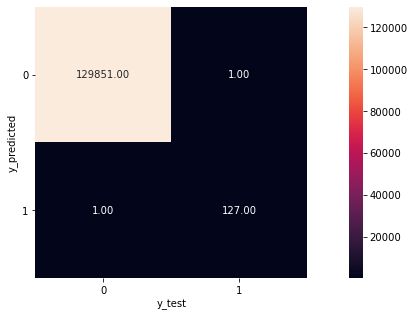

In [31]:
evaluate_model_cv(tree, X_train[columns_wo_ecgsig], y_train, X_valid[columns_wo_ecgsig], y_valid, 5)

('CV:',
 Recall       0.999997
 Precision    0.999997
 Accuracy     0.999997
 F1           0.999997
 dtype: float64,
 'Test recall:',
 0.9999769195260809,
 'Test precision:',
 0.9999770387457673,
 'Test accuracy: ',
 0.9999769195260809,
 'test_quadratic_weighted_kappa: ',
 0.9883152967670104)

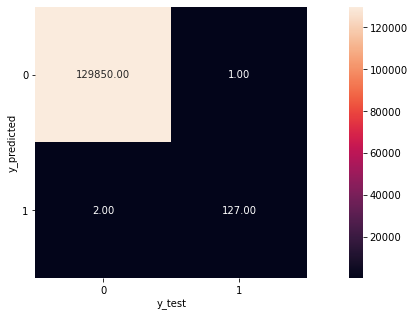

In [32]:
evaluate_model_cv(forest, X_train[columns_wo_ecgsig], y_train, X_valid[columns_wo_ecgsig], y_valid, 5)

('CV:',
 Recall       0.999987
 Precision    0.999988
 Accuracy     0.999987
 F1           0.999987
 dtype: float64,
 'Test recall:',
 0.9999769195260809,
 'Test precision:',
 0.9999770387457673,
 'Test accuracy: ',
 0.9999769195260809,
 'test_quadratic_weighted_kappa: ',
 0.9883152967670104)

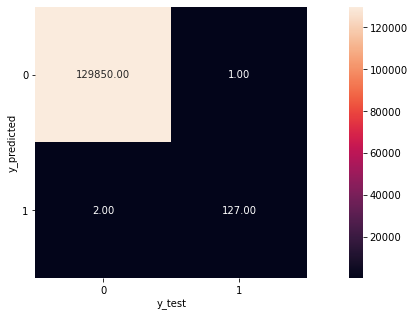

In [33]:
evaluate_model_cv(adaBoost, X_train[columns_wo_ecgsig], y_train, X_valid[columns_wo_ecgsig], y_valid, 5)

('CV:',
 Recall       0.999995
 Precision    0.999995
 Accuracy     0.999995
 F1           0.999995
 dtype: float64,
 'Test recall:',
 0.999761501769503,
 'Test precision:',
 0.9997615586933895,
 'Test accuracy: ',
 0.999761501769503,
 'test_quadratic_weighted_kappa: ',
 0.8621051373637317)

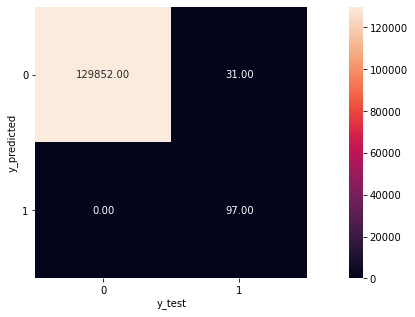

In [34]:
evaluate_model_cv(sv, X_train[columns_wo_ecgsig], y_train, X_valid[columns_wo_ecgsig], y_valid, 5)

('CV:',
 Recall       0.999997
 Precision    0.999997
 Accuracy     0.999997
 F1           0.999997
 dtype: float64,
 'Test recall:',
 0.99991537159563,
 'Test precision:',
 0.9999144851720436,
 'Test accuracy: ',
 0.99991537159563,
 'test_quadratic_weighted_kappa: ',
 0.9557809719068855)

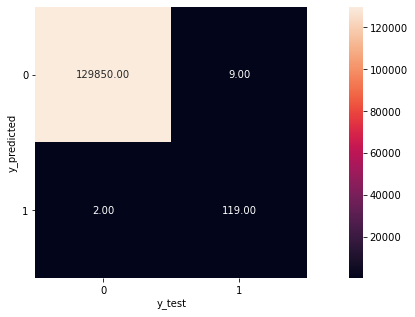

In [35]:
evaluate_model_cv(lgbm, X_train[columns_wo_ecgsig], y_train, X_valid[columns_wo_ecgsig], y_valid, 5)

('CV:',
 Recall       1.0
 Precision    1.0
 Accuracy     1.0
 F1           1.0
 dtype: float64,
 'Test recall:',
 0.9999615325434682,
 'Test precision:',
 0.999961411563868,
 'Test accuracy: ',
 0.9999615325434682,
 'test_quadratic_weighted_kappa: ',
 0.9803729045455737)

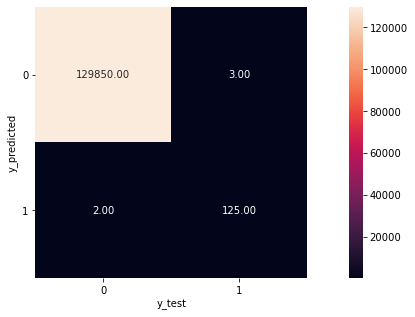

In [36]:
evaluate_model_cv(xgb, X_train[columns_wo_ecgsig], y_train, X_valid[columns_wo_ecgsig], y_valid, 5)

In [ ]:
# evaluate_model_cv(GradBoost, X_train, y_train, X_valid, y_valid, 5) # too slow

## Rank Features with Shapley Additive Explanation
The creator of Shapley Additive Explanations, Scott Lundberg, has written an efficient implementation that we can install and use. We’ll be able to use this to determine both local feature importance (for a single observation) and global feature importance (for all training samples as a whole). To aggregate local feature importance into global feature importance, we take the absolute values of the local feature importances, and then average them.

We can calculate the feature importance using sklearn and using the Shap library.

Based on the feature importances, we can think about modifying features to improve them. Then we can re-train the model on the modified features.

Finally, we can prune the feature set to just use the most relevant features.

In [37]:
import shap
shap.initjs() #initialize javascript to enable visualizations

In [38]:
df_all['ecg_type'].value_counts()

0    649556
1       444
Name: ecg_type, dtype: int64

In [39]:
n_jobs=20
nthread=20
# clf_allFeatures = xgboost.XGBClassifier(random_state=100, nthread=40)
clf_allFeatures = RandomForestClassifier(random_state=100, n_jobs=n_jobs)
# clf_allFeatures = LGBMClassifier(random_state=100, n_jobs=n_jobs)

clf_allFeatures.fit(X_train[columns_wo_ecgsig], y_train)

# this will take a few seconds to run
explainer = shap.TreeExplainer(clf_allFeatures)
shap_values = explainer.shap_values(X_train[columns_wo_ecgsig], check_additivity=False)

In [40]:
# features, data points
print(shap_values[0].shape) 
print(shap_values[1].shape) 

(389980, 31)
(389980, 31)


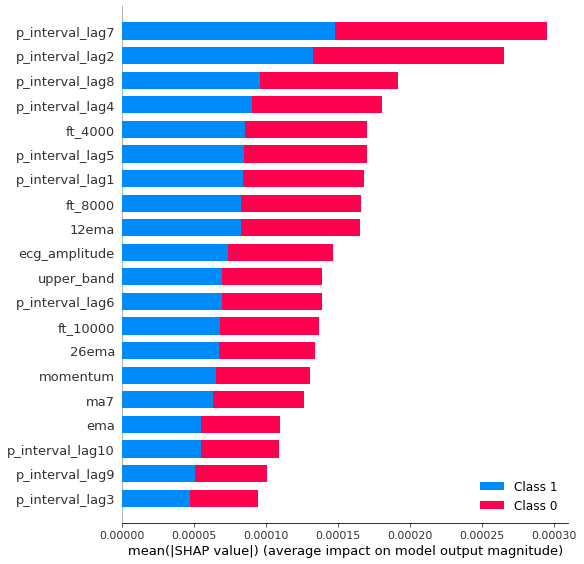

In [41]:
# mean of absolute values for each feature to get global feature importance
shap.summary_plot(shap_values, X_train[columns_wo_ecgsig], plot_type="bar")

In [42]:
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
# shap.force_plot(explainer.expected_value, shap_values[0,:], X_train.iloc[0,:])

In [43]:
features_list = X_train[columns_wo_ecgsig].columns

In [44]:
def model_shap_importances(model, features, X):
    """
    Note that the observations should be numeric (integer or float).
    So booleans should be converted to 1 (True) and 0 (False) 
    """
    # calculate shap values
    shap_values = shap.TreeExplainer(model, check_additivity=False).shap_values(X)
    
    # concatenate the shap values into one matrix (for other decision-treebased models other than xgboost)
    shap_values_matrix = np.concatenate(shap_values)
    # take the absolute values
    shap_abs = np.abs(shap_values_matrix)

    
#     # take the absolute values (xgboost model)
#     shap_abs = np.abs(shap_values)

    
    # Take the average for each feature (each column)
    global_importances = np.nanmean(shap_abs, axis=0)
        
    # get the indices sorted in descending order of global feature importance
    indices = np.argsort(global_importances)[::-1]

    features_ranked = []
    for f in range(X.shape[1]):
        print("%d. %s (%d) (%f)" % (f+1,features[indices[f]], indices[f], global_importances[indices[f]]))
        features_ranked.append(features[indices[f]])
        
    return features_ranked

In [45]:
# this will take a few seconds to run
features_ranked = model_shap_importances(clf_allFeatures, features_list, X_train[columns_wo_ecgsig])

1. p_interval_lag7 (7) (0.000148)
2. p_interval_lag2 (2) (0.000133)
3. p_interval_lag8 (8) (0.000096)
4. p_interval_lag4 (4) (0.000090)
5. ft_4000 (24) (0.000085)
6. p_interval_lag5 (5) (0.000085)
7. p_interval_lag1 (1) (0.000084)
8. ft_8000 (25) (0.000083)
9. 12ema (14) (0.000083)
10. ecg_amplitude (0) (0.000073)
11. upper_band (17) (0.000070)
12. p_interval_lag6 (6) (0.000069)
13. ft_10000 (26) (0.000068)
14. 26ema (13) (0.000067)
15. momentum (20) (0.000065)
16. ma7 (11) (0.000063)
17. ema (19) (0.000055)
18. p_interval_lag10 (10) (0.000055)
19. p_interval_lag9 (9) (0.000050)
20. p_interval_lag3 (3) (0.000047)
21. F2 (28) (0.000047)
22. MACD (15) (0.000041)
23. ft_2000 (23) (0.000023)
24. ma21 (12) (0.000020)
25. 20sd (16) (0.000017)
26. lower_band (18) (0.000013)
27. F1 (27) (0.000011)
28. F4 (30) (0.000004)
29. F3 (29) (0.000003)
30. ft_500 (21) (0.000001)
31. ft_1000 (22) (0.000000)


In [48]:
# select top 10 features
important_features = features_ranked[:16]
important_features

['p_interval_lag7',
 'p_interval_lag2',
 'p_interval_lag8',
 'p_interval_lag4',
 'ft_4000',
 'p_interval_lag5',
 'p_interval_lag1',
 'ft_8000',
 '12ema',
 'ecg_amplitude',
 'upper_band',
 'p_interval_lag6',
 'ft_10000',
 '26ema',
 'momentum',
 'ma7']

##### CF Results
Score best parameters:  0.9999974357659367
Test Accuracy Score:  0.9999692260347746
test_recall_score:  0.9999692260347746
test_precision_score:  0.9999692260347746
test_quadratic_weighted_kappa:  0.9764551911838295
CPU times: user 43.3 s, sys: 1.92 s, total: 45.2 s
Wall time: 20.5 s


[Text(0, 0.5, '0'), Text(0, 1.5, '1')]

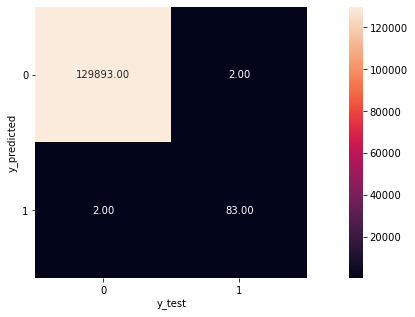

In [49]:
%%time
from sklearn.model_selection import cross_val_score
from sklearn.metrics import cohen_kappa_score, recall_score, precision_score, accuracy_score

nthread=30
n_jobs = 30
# clf_reducedFeatures = xgboost.XGBClassifier(random_state=100, nthread=nthread)
clf_reducedFeatures = RandomForestClassifier(random_state=100, n_jobs=n_jobs)
# clf_reducedFeatures = LGBMClassifier(random_state=100, n_jobs=n_jobs)

clf_reducedFeatures.fit(X_train[important_features], y_train)

score = cross_val_score(clf_reducedFeatures, X_train[important_features], y_train, cv=10).mean()
    
# prediction scores
pred = clf_reducedFeatures.predict(X_test[important_features])
test_recall_score = recall_score(y_test, pred, average='weighted')
test_precision_score =  precision_score(y_test, pred, average='weighted')
test_accuracy_score = accuracy_score(y_test, pred)
test_qwk_score = cohen_kappa_score(y_test, pred, weights='quadratic')

print("##### CF Results")
print("Score best parameters: ", score)
print("Test Accuracy Score: ", clf_reducedFeatures.score(X_test[important_features], y_test))
print("test_recall_score: ", test_recall_score)
print("test_precision_score: ", test_precision_score)
print("test_quadratic_weighted_kappa: ", test_qwk_score)

# plot the heatmap for crosstab matrix
df_crosstab = pd.DataFrame({'y_test': y_test, 'y_predicted': pred})

plt.figure(figsize=(15,5))
ax = sns.heatmap(pd.crosstab(df_crosstab.y_test, df_crosstab.y_predicted).T, 
                square=True, annot=True, fmt='.2f')

ax.set_yticklabels(
        ax.get_yticklabels(),
        rotation=0);


# Fully connected/dense neural network for classification

In [ ]:
# from sklearn.preprocessing import MinMaxScaler

# # Initialize a scaler, then apply it to the features
# scaler3 = MinMaxScaler() # default=(0, 1)
# numerical = list(X_train.columns)

# X_train_transformed = pd.DataFrame(data=X_train)
# X_valid_transformed = pd.DataFrame(data=X_valid)
# X_test_transformed = pd.DataFrame(data=X_test)

# X_train_transformed[numerical] = scaler.fit_transform(X_train[numerical]);
# X_valid_transformed[numerical] = scaler.transform(X_valid_transformed[numerical]);
# X_test_transformed[numerical] = scaler.transform(X_test[numerical]);

# X_train_transformed[numerical] = scaler.fit_transform(X_train_transformed[numerical])
# X_valid_transformed[numerical] = scaler.transform(X_valid_transformed[numerical])
# X_test_transformed[numerical] = scaler.transform(X_test_transformed[numerical])

# # Show an example of a record with scaling applied
# display(X_train_transformed.head(n = 5))
# display(X_valid_transformed.head(n = 5))
# display(X_test_transformed.head(n = 5))

In [72]:
import torch
from torch.utils.data import TensorDataset, DataLoader

# number of subprocesses to use for data loading
num_workers = 0
# how many samples per batch to load
batch_size =2000

# prepare data loaders with random shuffling included
data_loaders = {}
data_loaders['train'] = torch.utils.data.DataLoader(TensorDataset(torch.from_numpy(np.asarray(X_train[columns_wo_ecgsig])).float(), torch.from_numpy(np.asarray(y_train.astype(int)))),
                                          batch_size=batch_size,
                                          shuffle=True,
                                          num_workers=num_workers)

data_loaders['valid']  = torch.utils.data.DataLoader(TensorDataset(torch.from_numpy(np.asarray(X_valid[columns_wo_ecgsig])).float(), torch.from_numpy(np.asarray(y_valid.astype(int)))),
                                          batch_size=batch_size,
                                          shuffle=True,
                                          num_workers=num_workers)

data_loaders['test']  = torch.utils.data.DataLoader(TensorDataset(torch.from_numpy(np.asarray(X_test[columns_wo_ecgsig])).float(), torch.from_numpy(np.asarray(y_test.astype(int)))),
                                          batch_size=batch_size,
                                          shuffle=True,
                                          num_workers=num_workers)

print('Total training data: {}'.format(len(X_train[columns_wo_ecgsig])))
print('Total validation data: {}'.format(len(X_valid[columns_wo_ecgsig])))
print('Total test data: {}'.format(len(X_test[columns_wo_ecgsig])))

# Get the number of classes
# n_classes = len(X_train.accuracy_group.unique())
# print('Number of classes in train_data: {}'.format(n_classes))

Total training data: 389980
Total validation data: 129980
Total test data: 129980


In [73]:
import torch.nn as nn
import torch.nn.functional as F

#########################################################
# Set your hyperparameters here
##########################################################
x_size = len(X_train[columns_wo_ecgsig].columns)
n_classes = len(y_train.unique()) # number of classes (0, 1, 2, 3)
n_epochs = 40
learning_rate = 0.001
hidden_dim = 64
patience = 10
# embedding_dim = 20

class NeuralNetwork(nn.Module):

    def __init__(self, x_size, n_classes, hidden_dim, dropout=0.3):
        """
        Initialize the PyTorch NN Module
        :param x_size: The number of input dimensions of the neural network (the size of the variables)
        :param n_classes: The number of output dimensions of the neural network
        :param embedding_dim: The size of embeddings, should you choose to use them        
        :param hidden_dim: The size of the hidden layer outputs
        :param dropout: dropout to add in between Linear layers
        """
        super(NeuralNetwork, self).__init__()

        # complete init function
        self.n_hidden = hidden_dim
        self.n_classes = n_classes
        
        # define model layers

        # Define the fully-connected layers
        self.fc1 = nn.Linear(x_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, int(hidden_dim*2))
        self.fc3 = nn.Linear(int(hidden_dim*2), n_classes)

        # Define batch normalization layers
        self.bn1 = nn.BatchNorm1d(hidden_dim)
        self.bn2 = nn.BatchNorm1d(int(hidden_dim*2))
        self.bn3 = nn.BatchNorm1d(int(hidden_dim*4))
        
        # Define a dropout layer
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """

        # Define feedforward behavior
        x = self.dropout(x)
        x = F.leaky_relu(self.fc1(x), 0.2)
        # x = F.relu(self.fc1(x))
        x = self.bn1(x)
        x = self.dropout(x)
        x = F.leaky_relu(self.fc2(x), 0.2)
        # x = F.relu(self.fc2(x))
        # x = self.bn2(x)
        # x = self.dropout(x)
        x = F.leaky_relu(self.fc3(x), 0.2)
        # x = F.relu(self.fc3(x))

#         x = F.softmax(self.fc4(x))
        
        return x

# instantiate the NN
model_scratch = NeuralNetwork(x_size, n_classes, hidden_dim, dropout=0.3)
print(model_scratch)
# move tensors to GPU if CUDA is available
if use_cuda:
    model_scratch.cuda()

NeuralNetwork(
  (fc1): Linear(in_features=31, out_features=64, bias=True)
  (fc2): Linear(in_features=64, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=2, bias=True)
  (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn2): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (bn3): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (dropout): Dropout(p=0.3, inplace=False)
)


In [74]:
import torch.optim as optim
from torch.optim.optimizer import Optimizer

class Nadam(Optimizer):
    """Implements Nadam algorithm (a variant of Adam based on Nesterov momentum).

    It has been proposed in `Incorporating Nesterov Momentum into Adam`__.

    :param params: (iterable): iterable of parameters to optimize or dicts defining
        parameter groups
    :param lr: (float, optional): learning rate (default: 2e-3)
    :param betas: (Tuple[float, float], optional): coefficients used for computing
        running averages of gradient and its square
    :param eps: (float, optional): term added to the denominator to improve
        numerical stability (default: 1e-8)
    :param weight_decay: (float, optional): weight decay (L2 penalty) (default: 0)
    :param schedule_decay: (float, optional): momentum schedule decay (default: 4e-3)

    __ http://cs229.stanford.edu/proj2015/054_report.pdf
    __ http://www.cs.toronto.edu/~fritz/absps/momentum.pdf

    """

    def __init__(self, params, lr=2e-3, betas=(0.9, 0.999), eps=1e-8,
                 weight_decay=0, schedule_decay=4e-3):
        defaults = dict(lr=lr, betas=betas, eps=eps,
                        weight_decay=weight_decay, schedule_decay=schedule_decay)
        super(Nadam, self).__init__(params, defaults)

    def step(self, closure=None):
        """Performs a single optimization step.

        :param closure: (callable, optional): A closure that reevaluates the model
            and returns the loss.
        """
        loss = None
        if closure is not None:
            loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                if p.grad is None:
                    continue
                grad = p.grad.data
                state = self.state[p]

                # State initialization
                if len(state) == 0:
                    state['step'] = 0
                    state['m_schedule'] = 1.
                    state['exp_avg'] = grad.new().resize_as_(grad).zero_()
                    state['exp_avg_sq'] = grad.new().resize_as_(grad).zero_()

                # Warming momentum schedule
                m_schedule = state['m_schedule']
                schedule_decay = group['schedule_decay']
                exp_avg, exp_avg_sq = state['exp_avg'], state['exp_avg_sq']
                beta1, beta2 = group['betas']
                eps = group['eps']

                state['step'] += 1

                if group['weight_decay'] != 0:
                    grad = grad.add(group['weight_decay'], p.data)

                momentum_cache_t = beta1 * \
                    (1. - 0.5 * (0.96 ** (state['step'] * schedule_decay)))
                momentum_cache_t_1 = beta1 * \
                    (1. - 0.5 *
                     (0.96 ** ((state['step'] + 1) * schedule_decay)))
                m_schedule_new = m_schedule * momentum_cache_t
                m_schedule_next = m_schedule * momentum_cache_t * momentum_cache_t_1
                state['m_schedule'] = m_schedule_new

                # Decay the first and second moment running average coefficient
                bias_correction2 = 1 - beta2 ** state['step']

                exp_avg.mul_(beta1).add_(1 - beta1, grad)
                exp_avg_sq.mul_(beta2).addcmul_(1 - beta2, grad, grad)
                exp_avg_sq_prime = exp_avg_sq.div(1. - bias_correction2)

                denom = exp_avg_sq_prime.sqrt_().add_(group['eps'])

                p.data.addcdiv_(-group['lr'] * (1. - momentum_cache_t) / (1. - m_schedule_new), grad, denom)
                p.data.addcdiv_(-group['lr'] * momentum_cache_t_1 / (1. - m_schedule_next), exp_avg, denom)

        return loss

### Select loss function
criterion_scratch = nn.CrossEntropyLoss()

### Select optimizer
# optimizer_scratch = optim.SGD(model_scratch.parameters(), lr=learning_rate, momentum=0.9)
# optimizer_scratch = Nadam(model_scratch.parameters(), lr=learning_rate)
optimizer_scratch = optim.Adam(model_scratch.parameters(), lr=learning_rate)
# optimizer_scratch = optim.RMSprop(model_scratch.parameters(), lr=learning_rate)

In [75]:
import numpy as np
import torch

class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement. 
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta

    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            print(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), 'checkpoint.pt')
        self.val_loss_min = val_loss

In [76]:
def train(n_epochs, loaders, patience, model, optimizer, criterion, use_cuda, save_path):
    """returns trained model"""
    # initialize tracker for minimum validation loss
    valid_loss_min = np.Inf 
    
    # to track the average training loss per epoch as the model trains
    avg_train_losses = []
    # to track the average validation loss per epoch as the model trains
    avg_valid_losses = [] 
    
    # initialize the early_stopping object
    early_stopping = EarlyStopping(patience=patience, verbose=True)
    
    for epoch in range(1, n_epochs+1):
        # initialize variables to monitor training and validation loss
        train_loss = 0.0
        valid_loss = 0.0
        
        ###################
        # train the model #
        ###################
        model.train()
        for batch_idx, (data, target) in enumerate(loaders['train']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            # clear the gradients of all optimized variables
            optimizer.zero_grad()
            ## find the loss and update the model parameters accordingly
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # backward pass: compute gradient of the loss with respect to model parameters
            loss.backward()
            # perform a single optimization step (parameter update)
            optimizer.step()            
            ## record the average training loss, using something like
            ## train_loss = train_loss + ((1 / (batch_idx + 1)) * (loss.data - train_loss))
            # update training loss
            train_loss += loss.item()*data.size(0)
            
        ######################    
        # validate the model #
        ######################
        model.eval()
        for batch_idx, (data, target) in enumerate(loaders['valid']):
            # move to GPU
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            ## update the average validation loss
            # forward pass: compute predicted outputs by passing inputs to the model
            output = model(data)
            # calculate the batch loss
            loss = criterion(output, target)
            # update average validation loss 
            valid_loss += loss.item()*data.size(0)

        # calculate average losses
        train_loss = train_loss/len(loaders['train'])
        valid_loss = valid_loss/len(loaders['valid'])


        # print training/validation statistics 
        print('Epoch: {} / {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
            epoch, 
            n_epochs,
            train_loss,
            valid_loss
            ))
        
        # print training/validation statistics 
        # calculate average loss over an epoch
        avg_train_losses.append(train_loss)
        avg_valid_losses.append(valid_loss)     
        
        
        # early_stopping needs the validation loss to check if it has decresed, 
        # and if it has, it will make a checkpoint of the current model
        early_stopping(valid_loss, model)
        
        if early_stopping.early_stop:
            print("Early stopping")
            break

        ## TODO: save the model if validation loss has decreased
        if valid_loss <= valid_loss_min:
            print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
            valid_loss_min,
            valid_loss))
            torch.save(model.state_dict(), save_path)
            valid_loss_min = valid_loss
    
    # return trained model
    return model, avg_train_losses, avg_valid_losses

# # train the model
model_scratch, train_loss, valid_loss  = train(n_epochs, data_loaders, patience, model_scratch, optimizer_scratch, 
                      criterion_scratch, use_cuda, 'model_scratch.pt')

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))

Epoch: 1 / 40 	Training Loss: 207.500472 	Validation Loss: 16.464655
Validation loss decreased (inf --> 16.464655).  Saving model ...
Validation loss decreased (inf --> 16.464655).  Saving model ...
Epoch: 2 / 40 	Training Loss: 6.038310 	Validation Loss: 4.665831
Validation loss decreased (16.464655 --> 4.665831).  Saving model ...
Validation loss decreased (16.464655 --> 4.665831).  Saving model ...
Epoch: 3 / 40 	Training Loss: 3.478879 	Validation Loss: 2.409232
Validation loss decreased (4.665831 --> 2.409232).  Saving model ...
Validation loss decreased (4.665831 --> 2.409232).  Saving model ...
Epoch: 4 / 40 	Training Loss: 2.764918 	Validation Loss: 1.818563
Validation loss decreased (2.409232 --> 1.818563).  Saving model ...
Validation loss decreased (2.409232 --> 1.818563).  Saving model ...
Epoch: 5 / 40 	Training Loss: 2.324353 	Validation Loss: 1.228872
Validation loss decreased (1.818563 --> 1.228872).  Saving model ...
Validation loss decreased (1.818563 --> 1.228872).  

<All keys matched successfully>

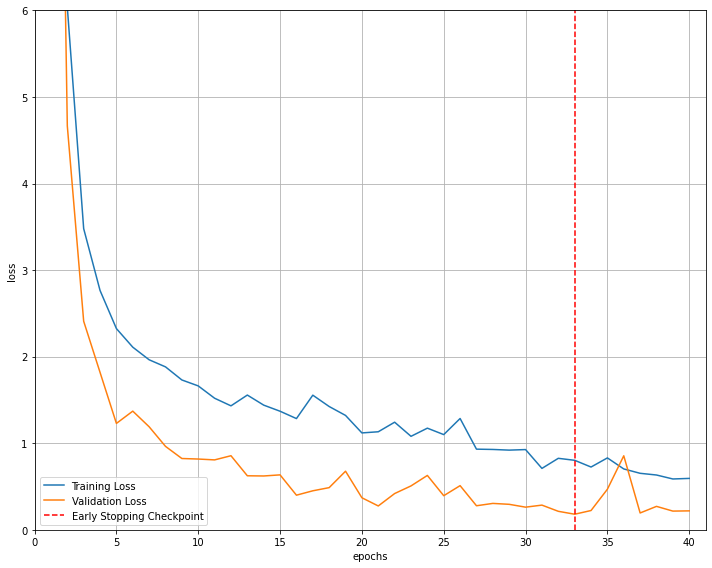

In [77]:
import matplotlib.pyplot as plt

# visualize the loss as the network trained
fig = plt.figure(figsize=(10,8))
plt.plot(range(1,len(train_loss)+1),train_loss, label='Training Loss')
plt.plot(range(1,len(valid_loss)+1),valid_loss,label='Validation Loss')

# find position of lowest validation loss
minposs = valid_loss.index(min(valid_loss))+1 
plt.axvline(minposs, linestyle='--', color='r',label='Early Stopping Checkpoint')

plt.xlabel('epochs')
plt.ylabel('loss')
plt.ylim(0, 6) # consistent scale
plt.xlim(0, len(train_loss)+1) # consistent scale
plt.grid(True)
plt.legend()
plt.tight_layout()

plt.show()
fig.savefig('loss_plot.png', bbox_inches='tight')

In [79]:
def test(loaders, model, criterion, use_cuda):

    # monitor test loss and accuracy
    test_loss = 0.
    correct = 0.
    total = 0.

    model.eval()
    for batch_idx, (data, target) in enumerate(loaders['test']):
        # move to GPU
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # update average test loss 
        test_loss = test_loss + ((1 / (batch_idx + 1)) * (loss.data - test_loss))
        # convert output probabilities to predicted class
        pred = output.data.max(1, keepdim=True)[1]
        # compare predictions to true label
        results_check = pd.DataFrame(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy(), 
                                     index=target.cpu().numpy(), columns=['results'])
#         print(results_check[results_check['results'] == False])
        correct += np.sum(np.squeeze(pred.eq(target.data.view_as(pred))).cpu().numpy())
        total += data.size(0)
            
    print('Test Loss: {:.6f}\n'.format(test_loss))

    print('\nTest Accuracy: %2d%% (%2d/%2d)' % (
        100. * correct / total, correct, total))

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))
    
# # call test function    
test(data_loaders, model_scratch, criterion_scratch, use_cuda)

Test Loss: 0.000075


Test Accuracy: 99% (129978/129980)


In [80]:
def predict_class(df_input, model, use_cuda):

    model.eval()

    if use_cuda:
        input = torch.from_numpy(np.asarray(df_input.values)).float().cuda()
    else:
        input = torch.from_numpy(np.asarray(df_input.values)).float()
    
    if use_cuda:
        model = model.cuda()
    else:
        model = model.cpu()

    output = model(input)
    pred = output.data.max(1, keepdim=True)[1]
    # output_columns = ['Epithelial1_proportion', 'Epithelial2_proportion', 'Epithelial3_stem1_proportion', 
    #                   'Epithelial3_stem2_proportion']

    return pred

# load the model that got the best validation accuracy
model_scratch.load_state_dict(torch.load('model_scratch.pt'))
  
# predicting cell_proportion
Results_final_idx = predict_class(X_test[columns_wo_ecgsig], model_scratch, use_cuda)
np.unique(Results_final_idx, return_counts=True)

(array([0, 1]), array([129897,     83]))

# Test results

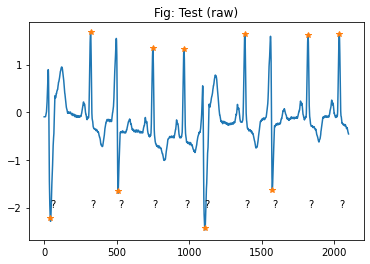

In [50]:
#What's included in the testing database? 
#1. The testing database contains a group of ECG signals. However,  
#2. Type of each beat is unknown (?, ?, ...). For example: 
testing_file_path = './database/test/b2'
ecg_sig, ecg_type, ecg_peak = read_ecg(testing_file_path)
plot_ecg(ecg_sig, ecg_type, ecg_peak, title='Fig: Test (raw)', len_sig=2100)

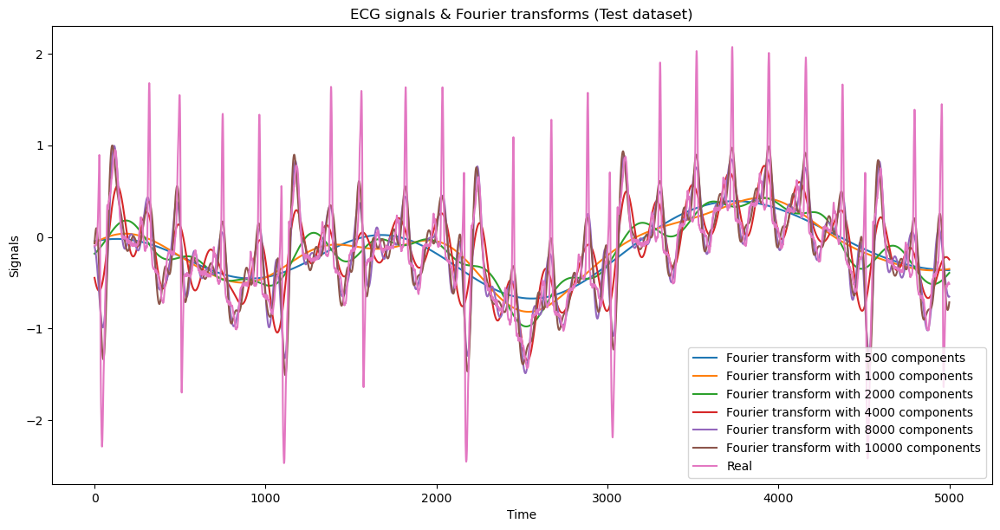

In [51]:
### type -  test
###################################################################
df_type_test = pd.DataFrame(ecg_type, columns=['ecg_type'], index=ecg_peak)

### sig - test
###################################################################
df_sig_test = pd.DataFrame(ecg_sig, columns=['ecg_sig'])

# adding other attributes
df_sig_test['ecg_amplitude'] = df_sig_test['ecg_sig'] - df_sig_test['ecg_sig'].median()
df_sig_test = get_time_series_indicators(df_sig_test)

close_fft_test = np.fft.fft(np.asarray(df_sig_test['ecg_sig'].tolist()))
fft_df_test = pd.DataFrame({'fft':close_fft_test})
fft_df_test['absolute'] = fft_df_test['fft'].apply(lambda x: np.abs(x))
fft_df_test['angle'] = fft_df_test['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list_test = np.asarray(fft_df_test['fft'].tolist())
for num_ in [500, 1000, 2000, 4000, 8000, 10000]:
    fft_list_test_m10 = np.copy(fft_list_test); 
    fft_list_test_m10[num_:-num_]=0
    df_sig_test['ft_{}'.format(num_)] = np.real_if_close(np.fft.ifft(fft_list_test_m10)).real
    plt.plot(np.real_if_close(np.fft.ifft(fft_list_test_m10)).real[:5000], label='Fourier transform with {} components'.format(num_));

plt.plot(df_sig_test['ecg_sig'][:5000],  label='Real');
plt.xlabel('Time');
plt.ylabel('Signals');
plt.title('ECG signals & Fourier transforms (Test dataset)');
plt.legend();
plt.show();

### peak test
###################################################################3
df_peak_test = pd.DataFrame(ecg_peak, columns=['ecg_peak'], index=ecg_peak)

# compute intervals with between n-lag of peaks
for lag_count in range(1, 11):
    df_peak_test['p_interval_lag{}'.format(lag_count)] = compute_intervals(df_peak_test['ecg_peak'], 
                                                                      lag_count)

In [52]:
df_all_test = pd.concat([df_sig_test, df_type_test, df_peak_test], axis=1)


In [53]:
df_all_test = df_all_test.drop(columns=['ecg_peak'])
df_all_test = df_all_test[20:]
df_features_test = df_all_test.drop(columns=['ecg_type'])
df_features_test = df_features_test.fillna(0)


In [54]:
X_test_final = pd.DataFrame(data=df_features_test)

# adding factors
X_test_final_varimax_princ_fa = pd.DataFrame(fa.transform(X_test_final), index=X_test_final.index, columns=['F{}'.format(i+1) for i in range(n_ftrs)])
X_test_final[['F{}'.format(i+1) for i in range(n_ftrs)]] = X_test_final_varimax_princ_fa[['F{}'.format(i+1) for i in range(n_ftrs)]]

# minmax scaling
X_test_final[numerical2] = scaler2.transform(df_features_test[numerical2])

# # Show an example of a record with scaling applied
display(X_test_final.head(n = 5))

,ecg_sig,ecg_amplitude,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,ft_500,ft_1000,ft_2000,ft_4000,ft_8000,ft_10000,p_interval_lag1,p_interval_lag2,p_interval_lag3,p_interval_lag4,p_interval_lag5,p_interval_lag6,p_interval_lag7,p_interval_lag8,p_interval_lag9,p_interval_lag10,F1,F2,F3,F4
20,0.568608,0.423495,0.543895,0.540648,0.591005,0.569410,0.495671,0.069687,0.446401,0.569967,0.563717,0.568608,1.235121,1.082381,0.817151,0.557695,0.466325,0.505105,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.311067e+12,-3.669003e+12,1.276239e+12,1.401452e+12
21,0.583416,0.438302,0.553045,0.544578,0.597293,0.577736,0.504269,0.088569,0.457831,0.563972,0.577592,0.583416,1.235430,1.083035,0.818032,0.556965,0.461074,0.498106,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.156818e+12,-3.579053e+12,1.243438e+12,1.366360e+12
22,0.598223,0.453110,0.563912,0.549273,0.604533,0.587273,0.514007,0.109319,0.470702,0.557756,0.592133,0.598223,1.235736,1.083687,0.818921,0.556356,0.455745,0.490493,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.008736e+12,-3.492729e+12,1.211946e+12,1.332636e+12
23,0.614018,0.468904,0.576351,0.554784,0.612727,0.597998,0.524807,0.131710,0.484956,0.551487,0.607557,0.614018,1.236041,1.084337,0.819819,0.555869,0.450355,0.482306,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.851487e+12,-3.401049e+12,1.178506e+12,1.296838e+12
24,0.633761,0.488648,0.590363,0.561317,0.622194,0.610399,0.537321,0.157033,0.501322,0.544693,0.625919,0.633761,1.236343,1.084984,0.820726,0.555506,0.444924,0.473586,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.639781e+12,-3.277489e+12,1.133492e+12,1.248796e+12


In [55]:
X_test_final = X_test_final[list(X_train.columns)]
X_test_final.columns

Index(['ecg_sig', 'ecg_amplitude', 'p_interval_lag1', 'p_interval_lag2', 'p_interval_lag3', 'p_interval_lag4', 'p_interval_lag5', 'p_interval_lag6', 'p_interval_lag7', 'p_interval_lag8', 'p_interval_lag9', 'p_interval_lag10', 'ma7', 'ma21', '26ema', '12ema', 'MACD', '20sd', 'upper_band', 'lower_band', 'ema', 'momentum', 'ft_500', 'ft_1000', 'ft_2000', 'ft_4000', 'ft_8000', 'ft_10000', 'F1', 'F2', 'F3', 'F4'], dtype='object')

In [56]:
n_jobs=30
nthread=30

# define model
tree = DecisionTreeClassifier(random_state=100)
forest = RandomForestClassifier(random_state=100, n_jobs=n_jobs)
adaBoost = AdaBoostClassifier(random_state=100)
GradBoost = GradientBoostingClassifier(random_state=100)
lgbm = LGBMClassifier(random_state=100, n_jobs=n_jobs)
xgb = xgboost.XGBClassifier(random_state=100, nthread=nthread)
sv = svm.SVC(random_state=100, decision_function_shape='ovo')


In [57]:
sv.fit(X_train[columns_wo_ecgsig], y_train)
pred = sv.predict(X_test_final[columns_wo_ecgsig])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

{0: 649980}

In [58]:
xgb.fit(X_train[columns_wo_ecgsig], y_train)
pred = xgb.predict(X_test_final[columns_wo_ecgsig])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

{0: 649977, 1: 3}

In [59]:
lgbm.fit(X_train[columns_wo_ecgsig], y_train)
pred = lgbm.predict(X_test_final[columns_wo_ecgsig])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

{0: 649977, 1: 3}

In [60]:
tree.fit(X_train[columns_wo_ecgsig], y_train)
pred = tree.predict(X_test_final[columns_wo_ecgsig])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

{0: 648064, 1: 1916}

In [61]:
forest.fit(X_train[columns_wo_ecgsig], y_train)
pred = forest.predict(X_test_final[columns_wo_ecgsig])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

{0: 649145, 1: 835}

In [62]:
adaBoost.fit(X_train[columns_wo_ecgsig], y_train)
pred = sv.predict(X_test_final[columns_wo_ecgsig])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

{0: 649980}

In [95]:
# Neural model
Results_test_final = predict_class(X_test_final[columns_wo_ecgsig], model_scratch, use_cuda)
np.unique(Results_test_final, return_counts=True)

(array([0]), array([649980]))

# Final model with selected features and test submission

In [73]:
print('Selected features for random forest: {}'.format(important_features))
xgb.fit(X_train[important_features], y_train)
pred = xgb.predict(X_test_final[important_features])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

Selected features for random forest: ['p_interval_lag7', 'p_interval_lag2', 'p_interval_lag8', 'p_interval_lag4', 'ft_4000', 'p_interval_lag5', 'p_interval_lag1', 'ft_8000', '12ema', 'ecg_amplitude', 'upper_band', 'p_interval_lag6', 'ft_10000', '26ema', 'momentum', 'ma7']


{0: 648704, 1: 1276}

In [67]:
print('Selected features for random forest: {}'.format(important_features))
forest.fit(X_train[important_features], y_train)
pred = forest.predict(X_test_final[important_features])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))

Selected features for random forest: ['p_interval_lag7', 'p_interval_lag2', 'p_interval_lag8', 'p_interval_lag4', 'ft_4000', 'p_interval_lag5', 'p_interval_lag1', 'ft_8000', '12ema', 'ecg_amplitude', 'upper_band', 'p_interval_lag6', 'ft_10000', '26ema', 'momentum', 'ma7']


{0: 649104, 1: 876}

In [75]:
len(important_features)

16

In [74]:
print('Selected features for random forest: {}'.format(important_features))
lgbm.fit(X_train[important_features], y_train)
pred = lgbm.predict(X_test_final[important_features])
unique, counts = np.unique(pred, return_counts=True)
dict(zip(unique, counts))


Selected features for random forest: ['p_interval_lag7', 'p_interval_lag2', 'p_interval_lag8', 'p_interval_lag4', 'ft_4000', 'p_interval_lag5', 'p_interval_lag1', 'ft_8000', '12ema', 'ecg_amplitude', 'upper_band', 'p_interval_lag6', 'ft_10000', '26ema', 'momentum', 'ma7']


{0: 649439, 1: 541}

In [172]:
# training dataset 'V' count..
df_all['ecg_type'].value_counts()

0    649556
1       444
Name: ecg_type, dtype: int64

In [76]:
X_test_final_labeled = X_test_final.copy()
X_test_final_labeled['ecg_type'] = pred

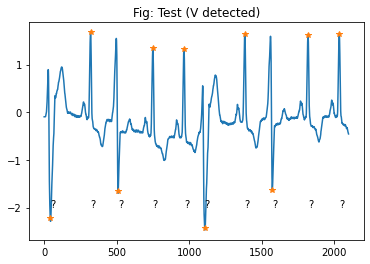

In [77]:
#Requirement: 
#1. develop an algorithm which identify all possible 'V' beats. 

#```
#Hint: use train a machine learning model to predict (e.g. scikit-learn library)
#a. segmentation based on peaks.
#b. feature extraction for each segment.
#c. initialize a classifier.
#d. train, evaluate, test.
#```

#2. The indentified beat shall be assigned as 'V'. For example:  
# ecg_type[0] = 'V' #assume the algorithm detected
# ecg_type[2] = 'V' #assume the algorithm detected
# ecg_type[5] = 'V' #assume the algorithm detected
# ecg_type[7] = 'V' #assume the algorithm detected
plot_ecg(ecg_sig, ecg_type, ecg_peak,title='Fig: Test (V detected)', len_sig=2100)

In [78]:
df_ecg_type_only = X_test_final_labeled.loc[df_type_test.index]
for item in range(len(df_ecg_type_only)):
    if df_ecg_type_only.iloc[item, -1:].values == 1:
        ecg_type[item] = 'V'

In [79]:
df_ecg_type_only[df_ecg_type_only['ecg_type'] == 1]

,ecg_sig,ecg_amplitude,p_interval_lag1,p_interval_lag2,p_interval_lag3,p_interval_lag4,p_interval_lag5,p_interval_lag6,p_interval_lag7,p_interval_lag8,p_interval_lag9,p_interval_lag10,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,ft_500,ft_1000,ft_2000,ft_4000,ft_8000,ft_10000,F1,F2,F3,F4,ecg_type
2035,0.848963,0.703850,0.426877,0.541080,0.548822,0.605349,0.569681,0.586947,0.595080,0.591787,0.623592,0.000000,0.798828,0.654249,0.740641,0.784237,0.753593,0.535051,0.741867,0.438753,0.845712,0.848963,1.054034,1.067139,0.831852,0.790944,0.651852,0.603535,2.847776e+15,-1.667782e+15,6.051263e+14,6.395712e+14,1
3307,0.896347,0.751234,0.581028,0.496479,0.535354,0.559687,0.603191,0.580557,0.581023,0.597999,0.602003,0.617284,0.818559,0.667517,0.758368,0.804854,0.768701,0.559472,0.763368,0.439081,0.887802,0.896347,1.386053,1.186770,0.900444,0.812356,0.659955,0.638642,2.706348e+15,-1.584952e+15,5.750712e+14,6.078106e+14,1
3521,0.926950,0.781836,0.422925,0.596244,0.536195,0.554468,0.570213,0.615244,0.580242,0.587302,0.609199,0.599888,0.875036,0.730237,0.824911,0.865821,0.772900,0.557088,0.813793,0.502250,0.922980,0.926950,1.587142,1.268281,0.989589,0.858365,0.714341,0.695491,2.600658e+15,-1.523048e+15,5.526109e+14,5.840802e+14,1
3729,0.933860,0.788746,0.411067,0.495305,0.602694,0.551207,0.562766,0.584208,0.607575,0.584541,0.597622,0.604658,0.883329,0.746058,0.843577,0.876901,0.754832,0.534720,0.817052,0.529567,0.930682,0.933860,1.660925,1.369006,1.017766,0.907186,0.731563,0.710727,2.598940e+15,-1.522043e+15,5.522459e+14,5.836940e+14,1
3943,0.920039,0.774926,0.422925,0.495305,0.535354,0.606654,0.563298,0.580557,0.583366,0.610766,0.596996,0.595960,0.869031,0.738352,0.834222,0.864266,0.741249,0.510410,0.800164,0.534672,0.916248,0.920039,1.609934,1.412297,1.053826,0.904972,0.731875,0.713669,2.858010e+15,-1.673767e+15,6.073018e+14,6.418808e+14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
638530,0.885489,0.740375,0.533597,0.489437,0.532828,0.582518,0.565957,0.606116,0.579461,0.621118,0.603254,0.593434,0.844009,0.722991,0.814489,0.841414,0.724748,0.480471,0.774548,0.535164,0.882975,0.885489,1.523865,1.299282,0.969061,0.891598,0.725516,0.658000,2.793403e+15,-1.635933e+15,5.935718e+14,6.273666e+14,1
638954,0.842053,0.696940,0.547431,0.497653,0.584175,0.548598,0.562234,0.601095,0.581023,0.604555,0.596996,0.624018,0.807263,0.686093,0.771161,0.799380,0.714542,0.461655,0.736096,0.508576,0.842180,0.842053,1.398574,1.212408,0.903261,0.817318,0.668296,0.643851,2.642736e+15,-1.547697e+15,5.615528e+14,5.935245e+14,1
639605,0.848963,0.703850,0.563241,0.505869,0.547980,0.605349,0.571809,0.613875,0.582585,0.589372,0.615770,0.600168,0.802402,0.686859,0.776719,0.798511,0.695838,0.453280,0.733084,0.513712,0.843238,0.848963,1.243758,1.347955,0.952166,0.848325,0.690396,0.642303,2.907523e+15,-1.702768e+15,6.178236e+14,6.529956e+14,1
641706,0.860809,0.715696,0.411067,0.487089,0.528620,0.585127,0.553191,0.571429,0.574385,0.580400,0.592929,0.589506,0.811410,0.655269,0.744759,0.793247,0.770593,0.574834,0.759995,0.418955,0.857314,0.860809,1.108976,1.072484,0.855623,0.802674,0.663195,0.658937,2.757828e+15,-1.615102e+15,5.860112e+14,6.193711e+14,1


In [82]:
#3. The assigned 'V' beat info shall be exported to WFDB format (*.test), 
#   and sent back to Biofourmis. 
wfdb.wrann('b2', 'test', ecg_peak, ecg_type, write_dir='./database/test/')

In [81]:
test_results_quickview = pd.DataFrame({'ecg_peak': ecg_peak, 'ecg_type': ecg_type})
test_results_quickview[test_results_quickview.ecg_type == 'V']

,ecg_peak,ecg_type
9,2035,V
15,3307,V
16,3521,V
17,3729,V
18,3943,V
...,...,...
3026,638530,V
3028,638954,V
3031,639605,V
3041,641706,V
